In [367]:
import scanpy as sc 
import matplotlib.pyplot as plt 
import plotly.express as px 
import plotly.graph_objects as go
import numpy as np
import pandas as pd 
import anndata as an


plt.figure(figsize=(9, 6), dpi=500)
sc.settings.set_figure_params(scanpy=True, vector_friendly=True, fontsize=14, figsize=(9, 6), dpi_save=500)

<Figure size 4500x3000 with 0 Axes>

We'll visualize the datasets with UMAP for some pretty plots in the paper. Let's begin with 

### Allen Brain Institute, Human cortical data

In [173]:
human = an.read_h5ad('../data/benchmark/human.h5ad')
human_labels = pd.read_csv('../data/benchmark/human_labels_clean.csv')

human = human[human_labels['cell'].values, :]
human.obs = human.obs.reset_index() # Since we selected human_labels['cell']
human.obs['class'] = human_labels['categorical_subclass_label']

# Calculate PCA for UMAP
sc.tl.pca(human, svd_solver='arpack')

# Neighborhood embedding + umap
sc.pp.neighbors(human, n_pcs=50)
sc.tl.umap(human)

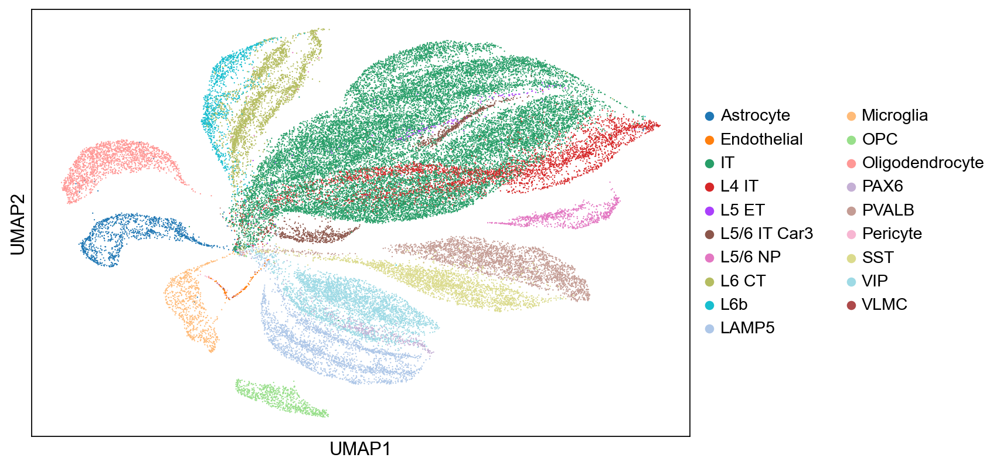

In [172]:
human.obs['class'] = human_labels['categorical_subclass_label']
human.obs['main_class'] = human_labels['class_label']

sc.pl.umap(human, color='class', save='_allen_human.pdf', size=4, title='')

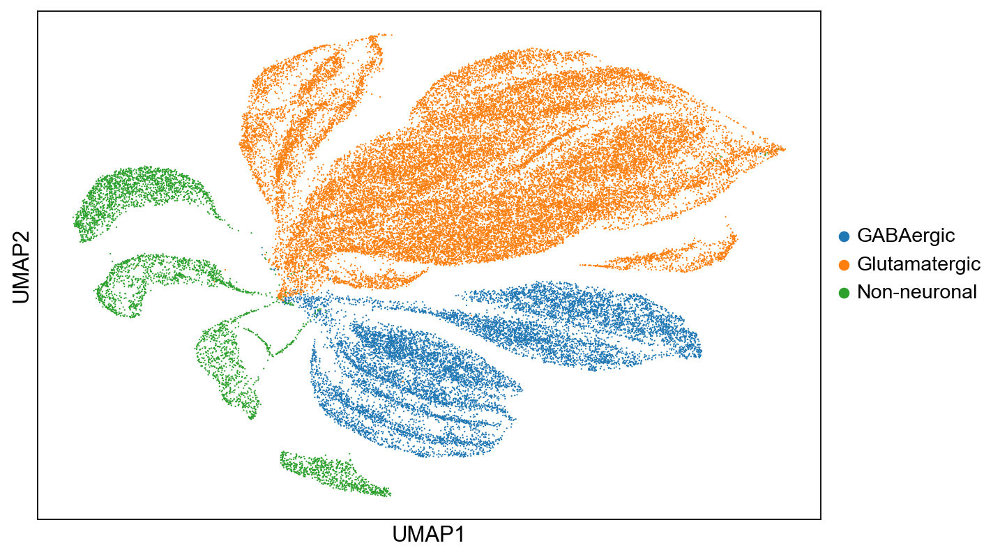

In [171]:
sc.pl.umap(human, color='main_class', save='_allen_human_shallowclass.pdf', size=4, title='')

We can re-use mostly the same code for the 

### Allen Brain Insitute mouse cortical data

/var/folders/pd/jsjcl0fn7w57s5mfr34b20pm0000gn/T/ipykernel_57957/585469.py:2: DtypeWarning: Columns (22) have mixed types. Specify dtype option on import or set low_memory=False.
  mouse_labels = pd.read_csv('../data/benchmark/mouse_labels_clean.csv')


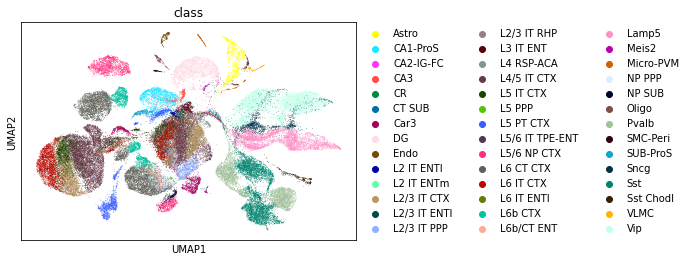

In [50]:
mouse = an.read_h5ad('../data/benchmark/mouse_clipped.h5ad')
mouse_labels = pd.read_csv('../data/benchmark/mouse_labels_clean.csv')

mouse = mouse[mouse_labels['cell'].values, :]
mouse.obs = mouse.obs.reset_index() # Since we selected human_labels['cell']
mouse.obs['class'] = mouse_labels['categorical_subclass_label']

# Calculate PCA for UMAP
sc.tl.pca(mouse, svd_solver='arpack')

# Neighborhood embedding + umap
sc.pp.neighbors(mouse, n_pcs=50)
sc.tl.umap(mouse)



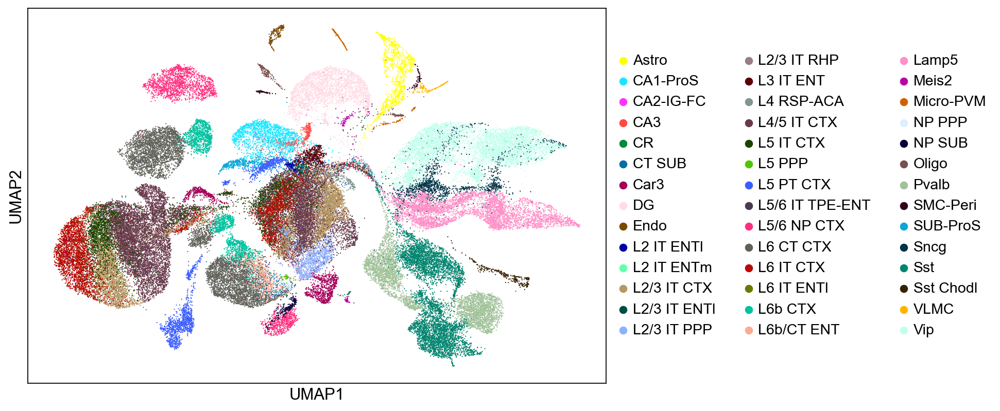

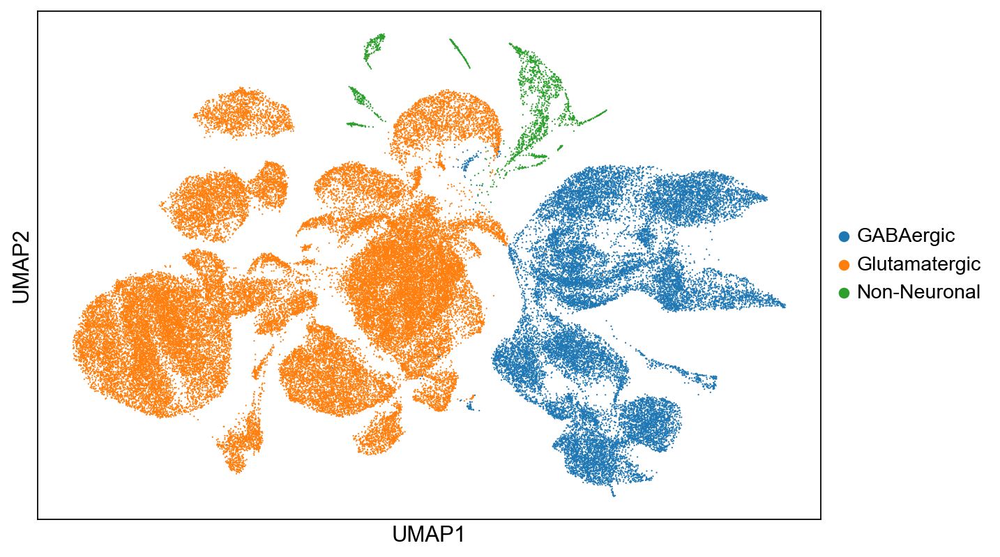

In [170]:
mouse.obs['main_class'] = mouse_labels['class_label']
mouse.obs['region_label'] = mouse_labels['region_label']

# Visualization
sc.pl.umap(mouse, color='class', save='_allen_mouse.pdf', title='', size=4)

sc.pl.umap(mouse, color='main_class', save='_allen_mouse_shallowclass.pdf', title='', size=4)

Finally, let's visualize the UCSF Bhaduri 2020 data 

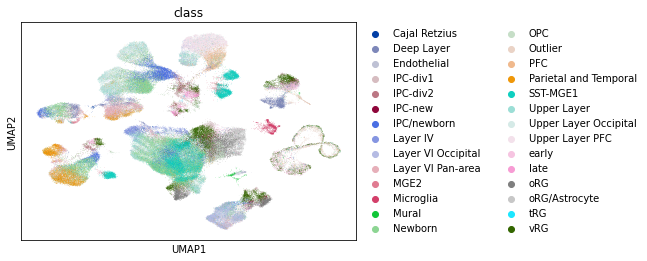

In [68]:
bhaduri = an.read_h5ad('../data/bhaduri/primary_T.h5ad')
bhaduri_labels = pd.read_csv('../data/bhaduri/primary_labels_clean.csv')

bhaduri = bhaduri[bhaduri_labels['cell'].values, :]
bhaduri.obs = bhaduri.obs.reset_index() # Since we selected human_labels['cell']
bhaduri.obs['class'] = bhaduri_labels['categorical_Subtype']

# Calculate PCA for UMAP
sc.tl.pca(bhaduri, svd_solver='arpack')

# Neighborhood embedding + umap
sc.pp.neighbors(bhaduri, n_pcs=50)
sc.tl.umap(bhaduri)



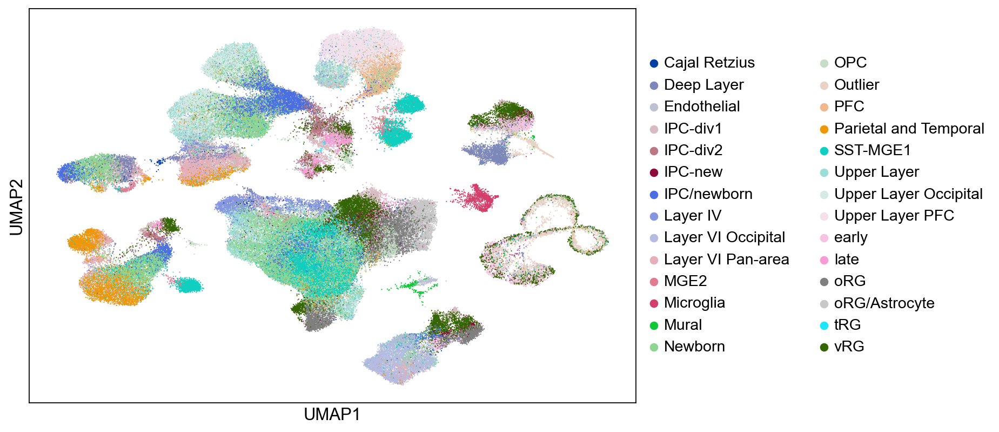

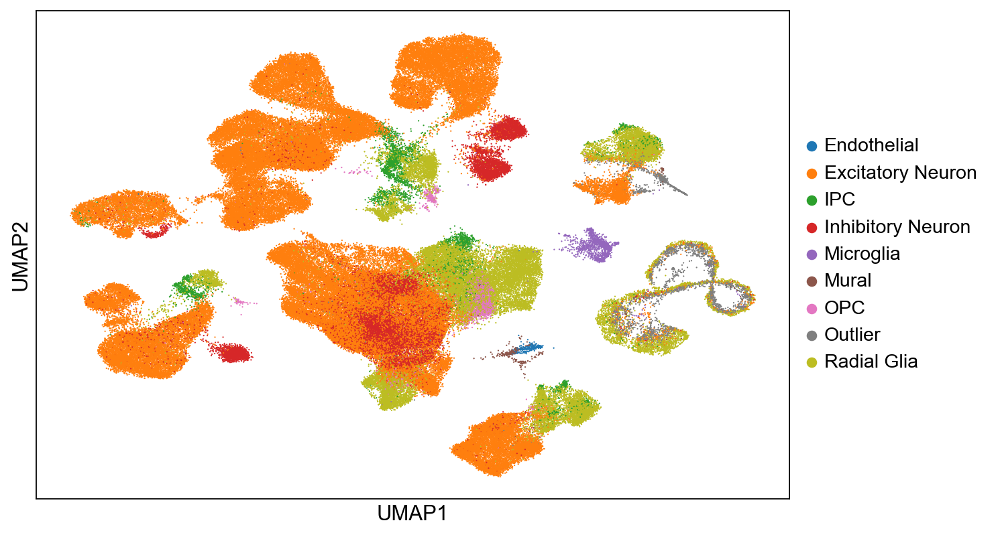

In [169]:
# bhaduri.obs['main_type'] = bhaduri_labels['Type']


# # Visualization
sc.pl.umap(bhaduri, color='class', save='_bhaduri_cortical.pdf', title='', size=4)
sc.pl.umap(bhaduri, color='main_type', save='_bhaduri_shallowclass.pdf', title='', size=4)

### Dental dataset visualization

In [82]:
dental = an.read_h5ad('../data/dental/human_dental_T.h5ad')
dental_labels = pd.read_csv('../data/dental/labels_raw.tsv', sep='\t')

dental.obs['class'] = dental_labels['cell_type']

# Calculate PCA for UMAP
sc.tl.pca(dental, svd_solver='arpack')

# Neighborhood embedding + umap
sc.pp.neighbors(dental, n_pcs=50)
sc.tl.umap(dental)

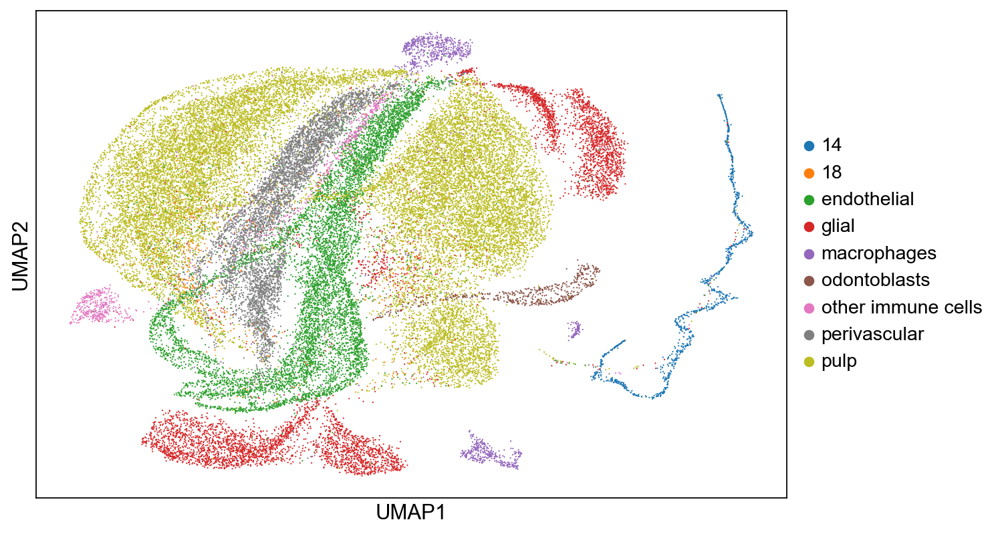

In [168]:
dental.obs = dental.obs.reset_index(drop=True)
dental.obs['class'] = dental_labels['cell_type']
sc.pl.umap(dental, color='class', save='_dental_class.pdf', title='', size=4)

### Retina dataset visualization

In [102]:
retina = an.read_h5ad('../data/retina/retina_T.h5ad')
retina.obs = retina.obs.reset_index(drop=True)

retina_labels = pd.read_csv('../data/retina/retina_labels_numeric.csv')
retina = retina[retina_labels['cell'].values, :]
retina.obs = retina.obs.reset_index(drop=True)

retina.obs['class'] = retina_labels['CellType']

# Calculate PCA for UMAP
sc.tl.pca(retina, svd_solver='arpack')

# Neighborhood embedding + umap
sc.pp.neighbors(retina, n_pcs=50)
sc.tl.umap(retina)

/Users/julian/miniconda3/envs/sims/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/julian/miniconda3/envs/sims/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/Users/julian/miniconda3/envs/sims/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


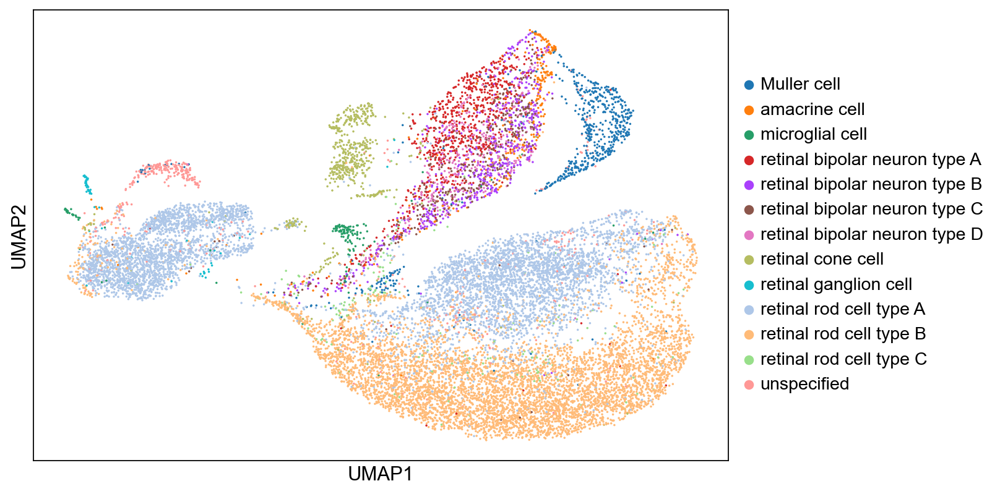

In [176]:

sc.pl.umap(retina, color='class', save='_retina_class.pdf', title='', size=10)

In [119]:
import plotly.graph_objects as go


vals = bhaduri_labels['categorical_Subtype'].value_counts()

fig = go.Figure(
    data=[
        go.Bar(x=vals.index, y=vals.values)
    ],
    layout=go.Layout(
        font_family='Serif',
        title='Distribution of Labels in UCSF Human Cortical Dataset'
    )
)


fig.write_image('../../ms-thesis/images/label_distributions/bhaduri_distribution.pdf')

## PCA Visualizations

It is also interesting to look at the first principal components, as well as the linear variation explained by each component

<Figure size 10000x5000 with 0 Axes>

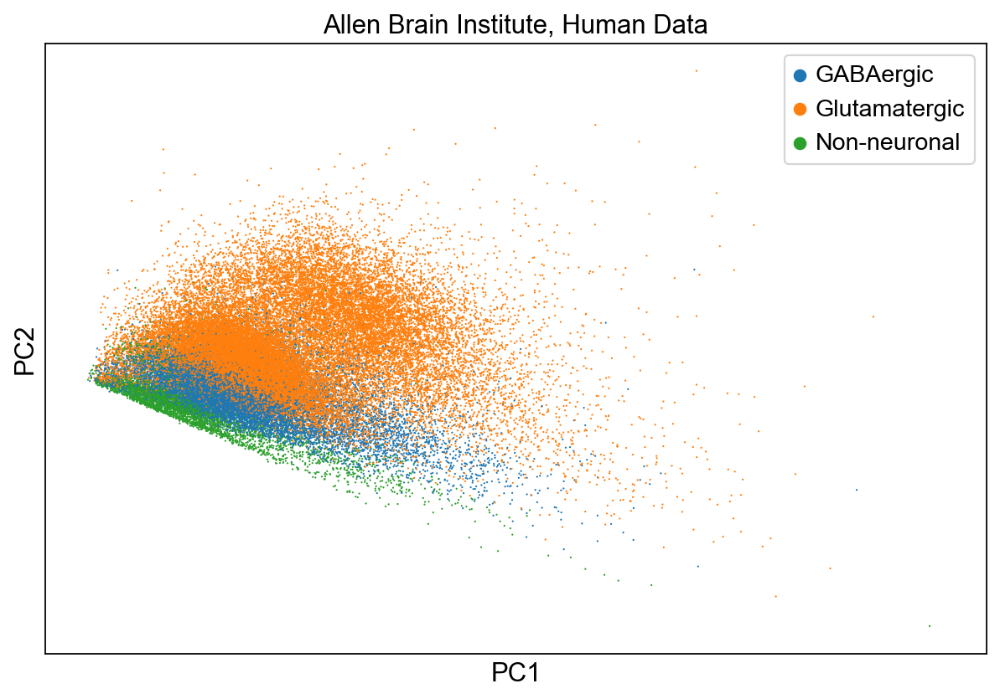

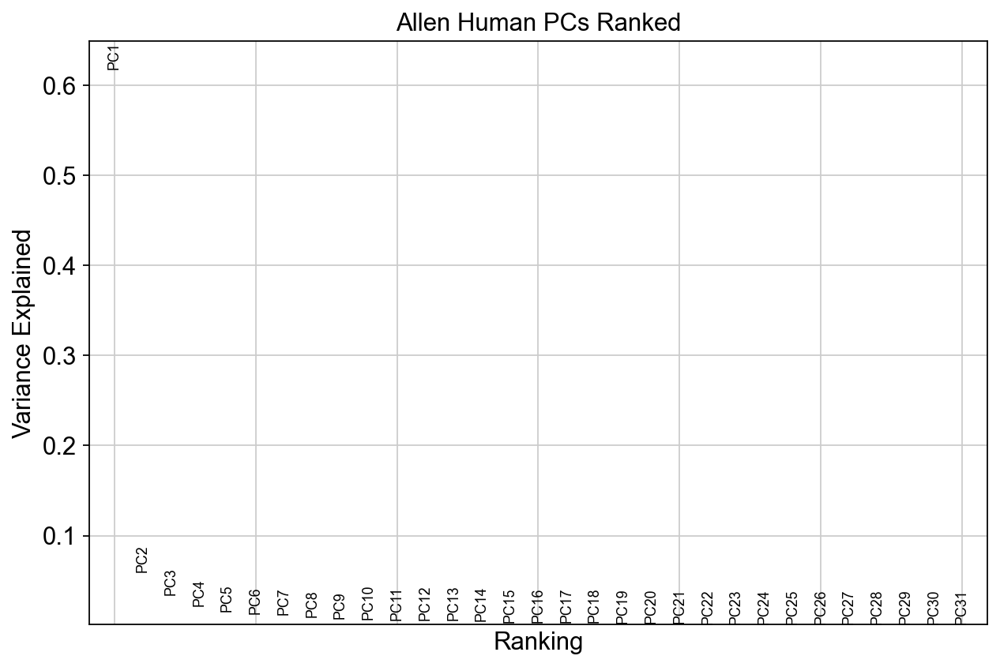

In [451]:
plt.figure(figsize=(20, 10), dpi=500)

ax = sc.pl.pca(
    human, 
    color='main_class', 
    title='Allen Brain Institute, Human Data', 
    size=4, 
    show=False
)

ax.legend(loc="upper right")
fig = ax.figure
fig.savefig('figures/pca_allen_pca_human.pdf', bbox_inches='tight')

var_explained_plots(
    human,
    'uns',
    'variance_ratio',
    n_points=30,
    dictionary='pca',
    labels='PC',
    show=False,
    title='Allen Human'
)

savefig_or_show('pca_variance_ratio', save='_allen_pca_variance_human.pdf')

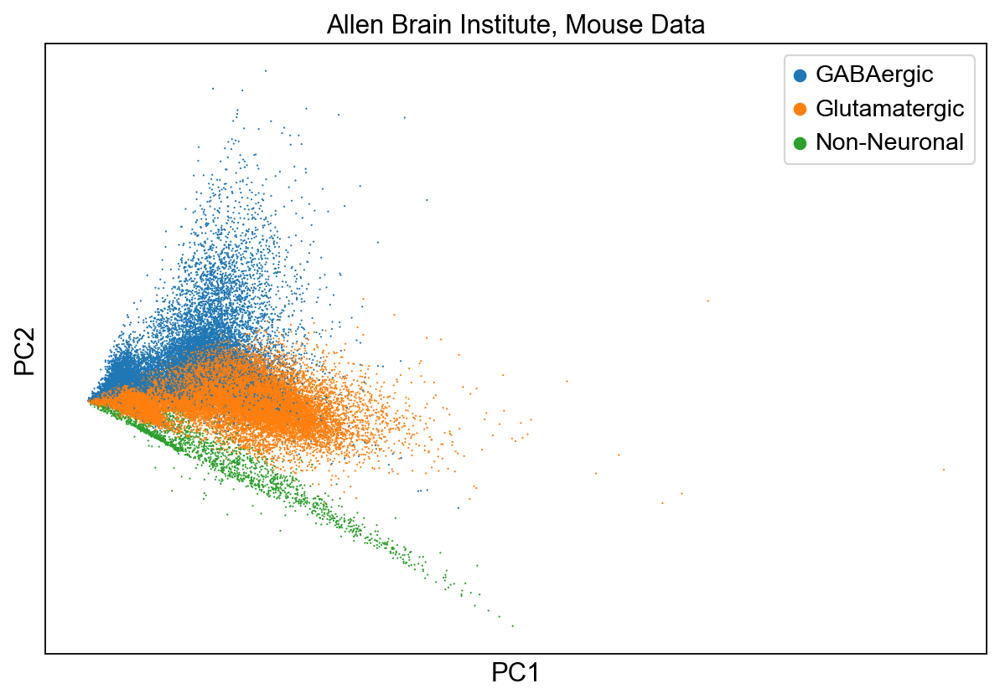

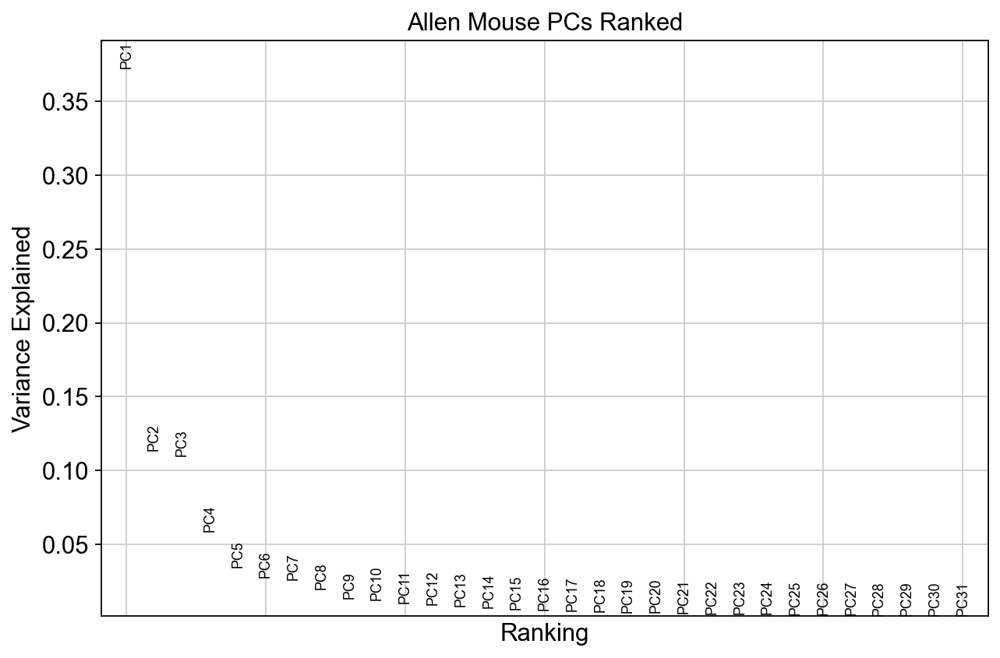

In [452]:
ax = sc.pl.pca(
    mouse, 
    color='main_class', 
    title='Allen Brain Institute, Mouse Data', 
    size=4, 
    show=False
)

ax.legend(loc="upper right")
ax.figure.savefig('figures/pca_allen_pca_mouse.pdf', bbox_inches='tight')

var_explained_plots(
    mouse,
    'uns',
    'variance_ratio',
    n_points=30,
    dictionary='pca',
    labels='PC',
    show=False,
    title='Allen Mouse'
)

savefig_or_show('pca_variance_ratio', save='_allen_pca_variance_mouse.pdf')

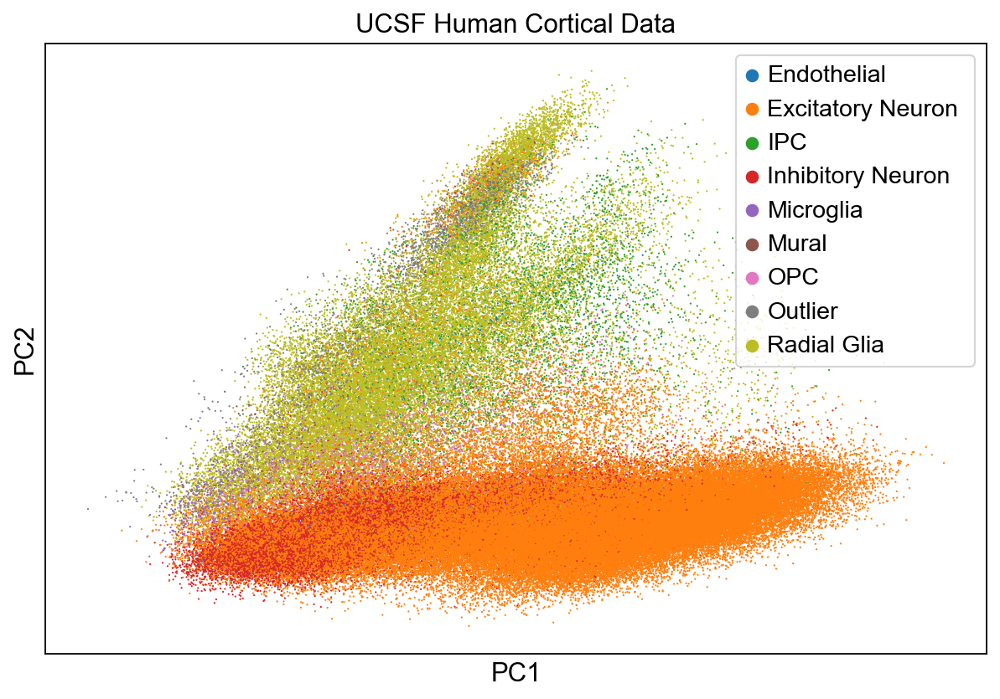

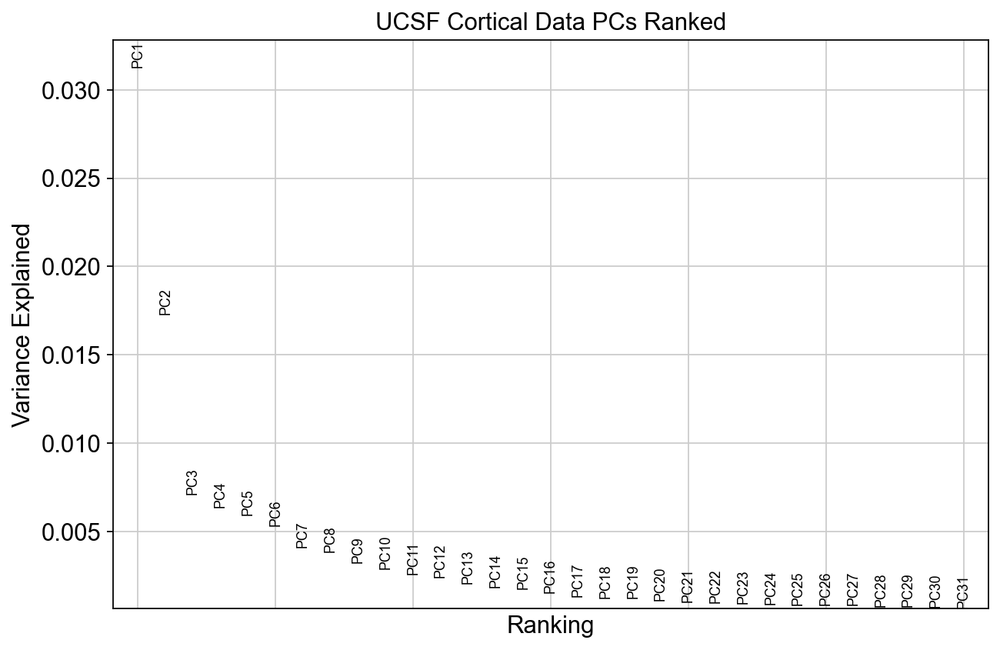

In [453]:
ax = sc.pl.pca(
    bhaduri, 
    color='main_type', 
    title='UCSF Human Cortical Data', 
    size=4, 
    show=False
)

ax.legend(loc="upper right")
ax.figure.savefig('figures/pca_ucsf_pca.pdf', bbox_inches='tight')

var_explained_plots(
    bhaduri,
    'uns',
    'variance_ratio',
    n_points=30,
    dictionary='pca',
    labels='PC',
    show=False,
    title='UCSF Cortical Data'
)

savefig_or_show('pca_variance_ratio', save='_ucsf_pca_variance.pdf')

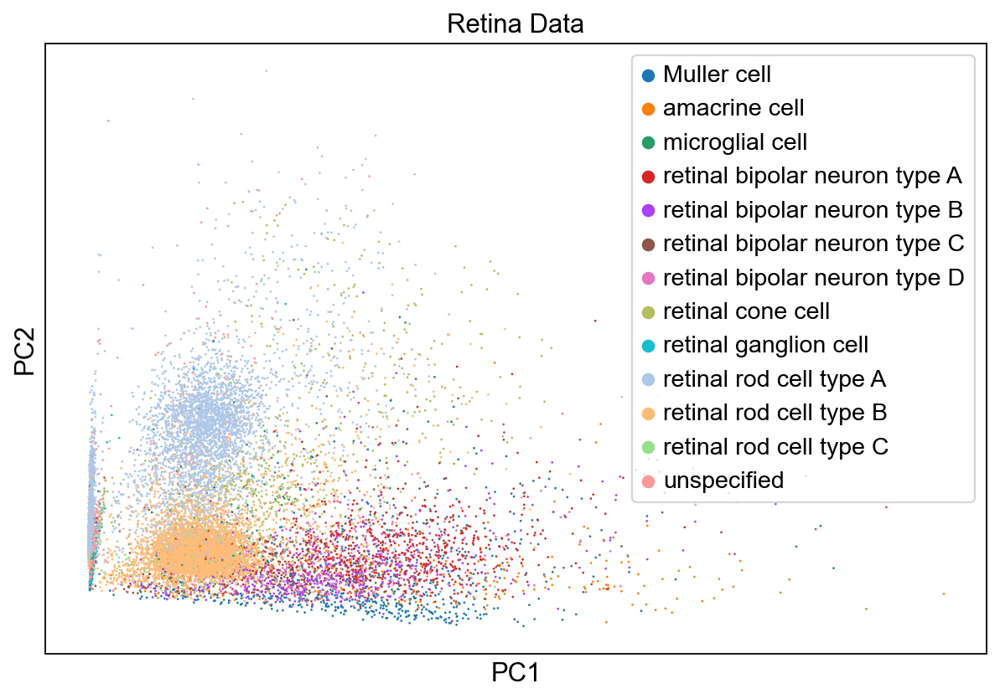

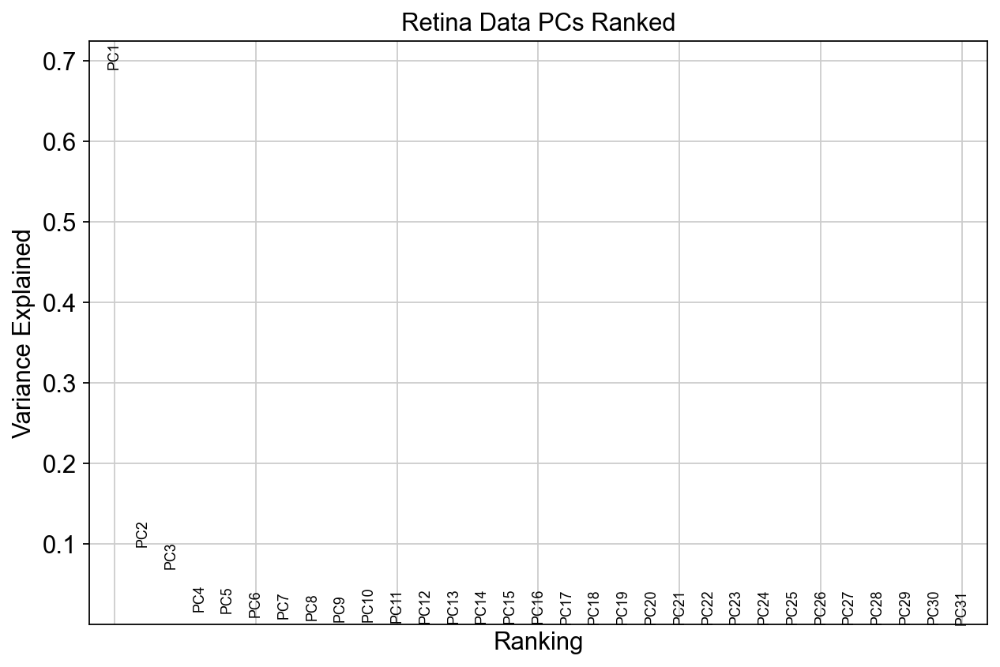

In [454]:
ax = sc.pl.pca(
    retina, 
    color='class', 
    title='Retina Data', 
    size=6, 
    show=False
)

ax.legend(loc="upper right")
ax.figure.savefig('figures/pca_retina_pca.pdf', bbox_inches='tight')

var_explained_plots(
    retina,
    'uns',
    'variance_ratio',
    n_points=30,
    dictionary='pca',
    labels='PC',
    show=False,
    title='Retina Data'
)

savefig_or_show('pca_variance_ratio', save='_retina_pca_variance.pdf')

In [455]:
ax

<AxesSubplot:title={'center':'Retina Data'}, xlabel='PC1', ylabel='PC2'>

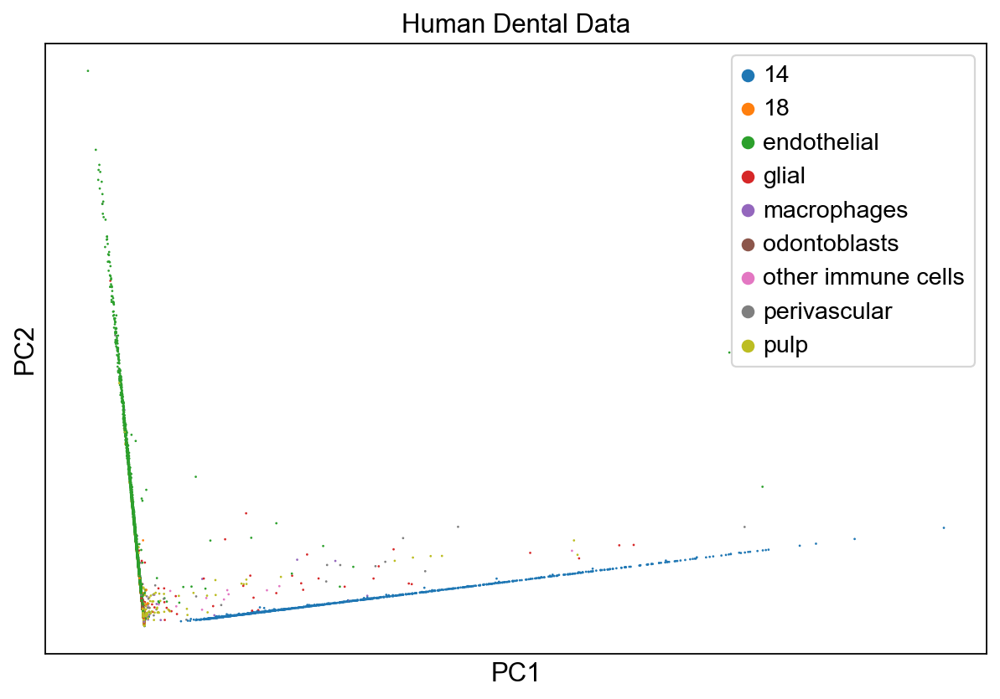

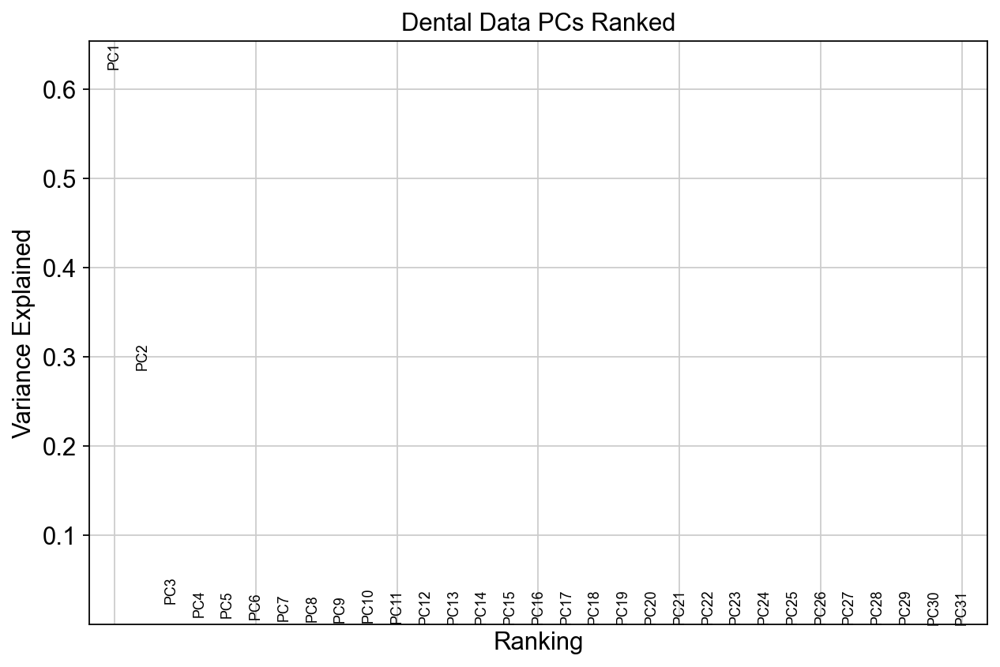

In [456]:
ax = sc.pl.pca(
    dental, 
    color='class', 
    title='Human Dental Data', 
    size=6, 
    show=False,
)

ax.legend(loc="upper right")
ax.figure.savefig('figures/pca_dental_pca.pdf', bbox_inches='tight')

var_explained_plots(
    dental,
    'uns',
    'variance_ratio',
    n_points=30,
    dictionary='pca',
    labels='PC',
    show=False,
    title='Dental Data'
)

savefig_or_show('pca_variance_ratio', save='_dental_pca_variance.pdf')


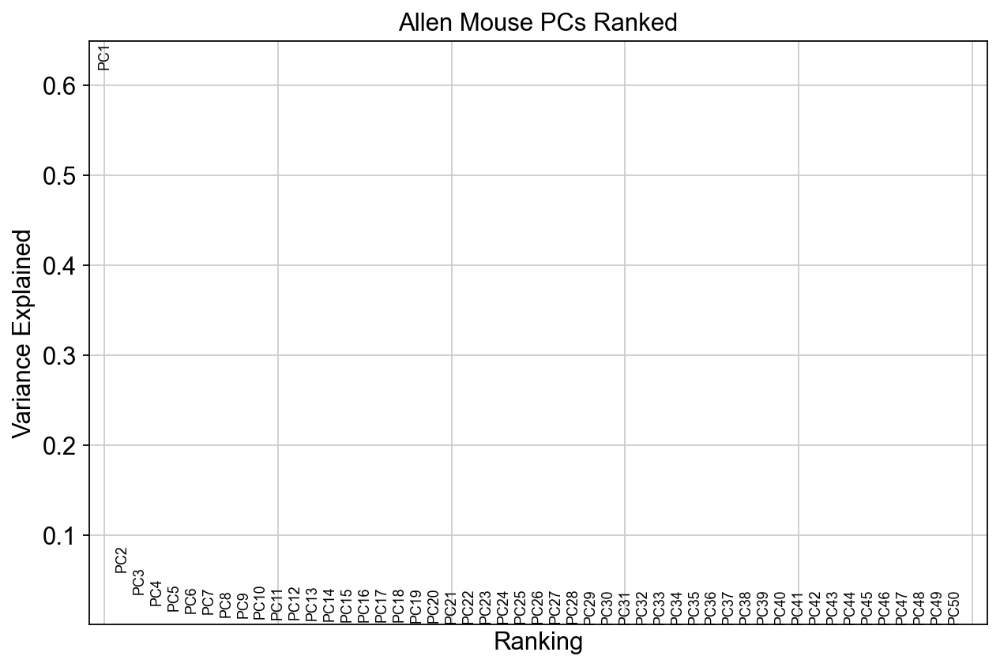

In [371]:
from typing import *
from anndata import AnnData
from matplotlib import pyplot as pl
from matplotlib import rcParams
from matplotlib import gridspec
from matplotlib import patheffects
from matplotlib.colors import is_color_like, Colormap, ListedColormap, Normalize

from scanpy.plotting._utils import savefig_or_show

def var_explained_plots(
    adata: AnnData,
    attr: Literal['var', 'obs', 'uns', 'varm', 'obsm'],
    keys: Union[str, Sequence[str]],
    dictionary=None,
    indices=None,
    labels=None,
    color='black',
    n_points=30,
    log=False,
    include_lowest=False,
    show=None,
    save=None,
    title=''
):
    if isinstance(keys, str) and indices is not None:
        scores = getattr(adata, attr)[keys][:, indices]
        keys = [f'{keys[:-1]}{i + 1}' for i in indices]
    else:
        if dictionary is None:
            scores = getattr(adata, attr)[keys]
        else:
            scores = getattr(adata, attr)[dictionary][keys]
    n_panels = len(keys) if isinstance(keys, list) else 1
    if n_panels == 1:
        scores, keys = scores[:, None], [keys]
    if log:
        scores = np.log(scores)
    if labels is None:
        labels = (
            adata.var_names
            if attr in {'var', 'varm'}
            else np.arange(scores.shape[0]).astype(str)
        )
    if isinstance(labels, str):
        labels = [labels + str(i + 1) for i in range(scores.shape[0])]
    if n_panels <= 5:
        n_rows, n_cols = 1, n_panels
    else:
        n_rows, n_cols = 2, int(n_panels / 2 + 0.5)
    _ = pl.figure(
        figsize=(
            n_cols * rcParams['figure.figsize'][0],
            n_rows * rcParams['figure.figsize'][1],
        )
    )
    left, bottom = 0.2 / n_cols, 0.13 / n_rows
    gs = gridspec.GridSpec(
        wspace=0.2,
        nrows=n_rows,
        ncols=n_cols,
        left=left,
        bottom=bottom,
        right=1 - (n_cols - 1) * left - 0.01 / n_cols,
        top=1 - (n_rows - 1) * bottom - 0.1 / n_rows,
    )
    for iscore, score in enumerate(scores.T):
        pl.subplot(gs[iscore])
        order_scores = np.argsort(score)[::-1]
        if not include_lowest:
            indices = order_scores[: n_points + 1]
        else:
            indices = order_scores[: n_points // 2]
            neg_indices = order_scores[-(n_points - (n_points // 2)) :]
        txt_args = dict(
            color=color,
            rotation='vertical',
            verticalalignment='bottom',
            horizontalalignment='center',
            fontsize=8,
        )
        for ig, g in enumerate(indices):
            pl.text(ig, score[g], labels[g], **txt_args)
        if include_lowest:
            score_mid = (score[g] + score[neg_indices[0]]) / 2
            if (len(indices) + len(neg_indices)) < len(order_scores):
                pl.text(len(indices), score_mid, '⋮', **txt_args)
                for ig, g in enumerate(neg_indices):
                    pl.text(ig + len(indices) + 2, score[g], labels[g], **txt_args)
            else:
                for ig, g in enumerate(neg_indices):
                    pl.text(ig + len(indices), score[g], labels[g], **txt_args)
            pl.xticks([])
        pl.title(keys[iscore].replace('_', ' '))
        pl.xlim(-0.9, n_points + 0.9 + (1 if include_lowest else 0))
        score_min, score_max = (
            np.min(score[neg_indices if include_lowest else indices]),
            np.max(score[indices]),
        )
        pl.ylim(
            (0.95 if score_min > 0 else 1.05) * score_min,
            (1.05 if score_max > 0 else 0.95) * score_max,
        )
        pl.title(f'{title} PCs Ranked')
        pl.tick_params(
            axis='x',          # changes apply to the x-axis
            which='both',      # both major and minor ticks are affected
            bottom=False,      # ticks along the bottom edge are off
            top=False,         # ticks along the top edge are off
            labelbottom=False
        ) # labels along the bottom edge are off    
        pl.xlabel('Ranking')
        pl.ylabel('Variance Explained')
        
        if save is not None:
            plt.savefig(save)
    
var_explained_plots(
    human,
    'uns',
    'variance_ratio',
    n_points=50,
    dictionary='pca',
    labels='PC',
    show=False,
    save='figures/test.pdf',
    title='Allen Mouse'
)

savefig_or_show('pca_variance_ratio', save='test.pdf')

NameError: name 'rcParams' is not defined